In [1]:
import geopandas as gpd
from pyproj import Proj, transform
from shapely.geometry import Point
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
import contextily as ctx
from pyproj import Proj, transform
import matplotlib.pyplot as plt
from scipy.stats import kurtosis, skew
import dask.dataframe as dd
from rasterio.transform import from_origin
import numpy as np
import rasterio



/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/dask/dataframe/_pyarrow_compat.py:23: UserWarning: You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.
  warnings.warn(


In [2]:
local_crs = 27700
place = "test"
lat = 55.86421405612109
lng = -4.251846930489373
country = "UK"
crs=4326
radius=1

In [3]:
if lng:
    lon = lng

In [4]:
lonlat=(lon, lat)

In [5]:
buildings = gpd.read_parquet(f"./output/{place}/buildings_morphometric_var.pq")
tessellation = gpd.read_parquet(f"./output/{place}/tessellation_morphometric_var.pq")
edges = gpd.read_parquet(f"output/{place}/edges.pq")
nodes = gpd.read_parquet(f"output/{place}/nodes.pq")
stroke = gpd.read_parquet(f"output/{place}/stroke_gdf.pq")

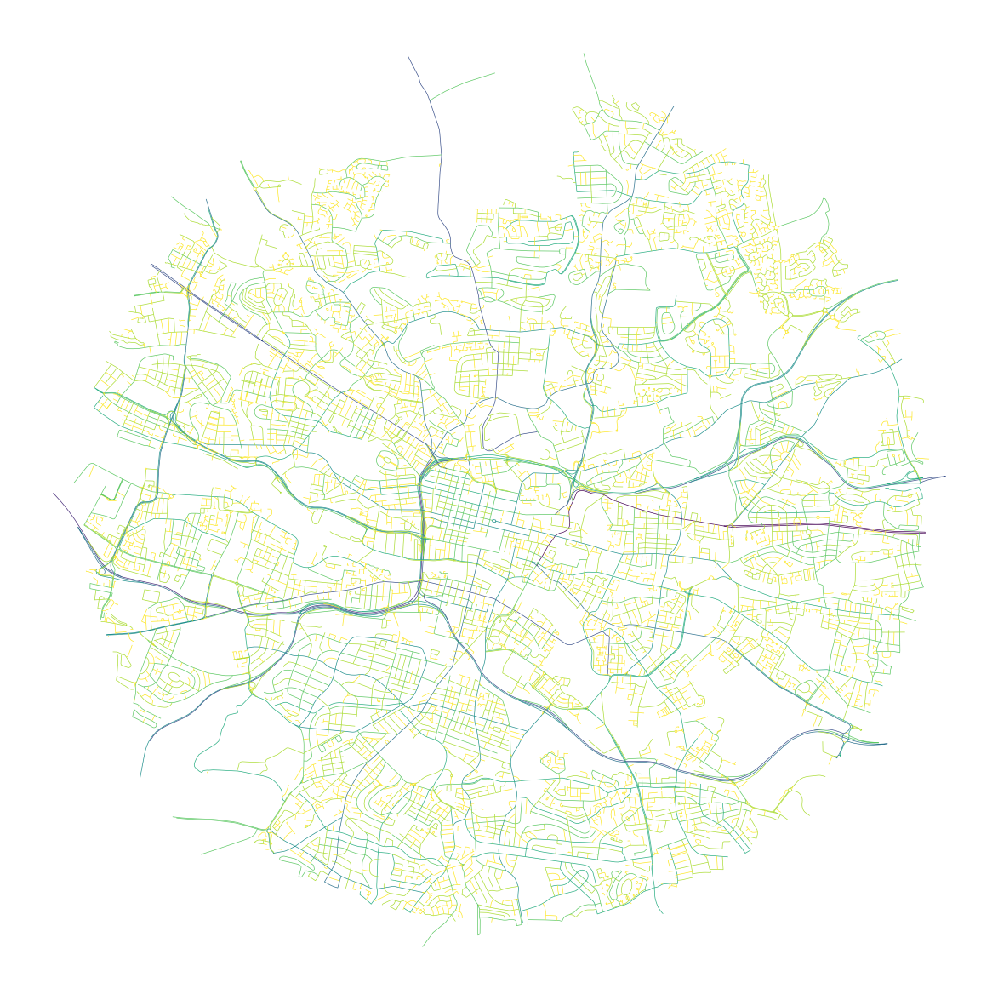

In [6]:
stroke.plot(stroke.length,
                figsize=(15, 15),
                cmap="viridis_r",
                linewidth=.5,
                scheme="headtailbreaks"
               ).set_axis_off()

In [7]:
stroke["stroke_length"] = stroke.length
stroke = stroke.drop(columns=["n_segments"])

In [8]:
buildings_merged = buildings.merge(tessellation.drop(columns=['geometry']), on='uID', how='inner')
buildings_merged_centroids = buildings_merged
buildings_merged_centroids["geometry"] = buildings_merged_centroids['geometry'].centroid

In [9]:
# Your latitude and longitude tuple (latitude, longitude)

# Transform the coordinates
centre_point_4326 = Point(lon, lat)
x_centre, y_centre = transform(4326, local_crs, lat, lon)
centre_point_local_crs = Point(x_centre, y_centre)

/tmp/ipykernel_28332/4192890295.py:5: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  x_centre, y_centre = transform(4326, local_crs, lat, lon)


## Linear Regression

In [10]:
buildings_merged_centroids['distance_to_centre'] = buildings_merged_centroids['geometry'].distance(centre_point_4326)
buildings_merged = buildings_merged_centroids.drop(columns=["uID", "geometry"])
buildings_merged = buildings_merged.dropna()

In [11]:
# Response variable
y = buildings_merged['distance_to_centre']

# Feature variables (excluding the response variable)
X = buildings_merged.drop(columns=['distance_to_centre'])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize and fit the Linear Regression model
model = LinearRegression()
model.fit(X_scaled, y)

# Coefficients and Intercept
coefficients = model.coef_
intercept = model.intercept_

# Predictions
predictions = model.predict(X_scaled)

# Number of observations and number of features
n = len(y)
p = X.shape[1]

# Residual Sum of Squares and Total Sum of Squares
rss = np.sum((y - predictions) ** 2)
tss = np.sum((y - np.mean(y)) ** 2)

# R-squared and Adjusted R-squared
r_squared = 1 - (rss / tss)
adjusted_r_squared = 1 - ((1 - r_squared) * (n - 1) / (n - p - 1))

# Standard Error of the coefficients
mse = rss / (n - p - 1)
se = np.sqrt(np.diagonal(mse * np.linalg.inv(np.dot(X_scaled.T, X_scaled))))

# t-statistics and p-values for coefficients
t_stats = coefficients / se
p_values = [2 * (1 - stats.t.cdf(np.abs(t), n - p - 1)) for t in t_stats]

# F-statistic
f_statistic = (r_squared / p) / ((1 - r_squared) / (n - p - 1))

def get_significance_asterisks(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# Create a summary DataFrame
summary_df = pd.DataFrame({
    'Coefficient': coefficients,
    'Standard Error': se,
    't value': t_stats,
    'p value': p_values,
    'Significance': [get_significance_asterisks(p) for p in p_values]
}, index=X.columns)
summary_df.loc['Intercept'] = [intercept, np.nan, np.nan, np.nan, '']

# Print summary statistics
print(f"Number of Observations: {n}")
print(f"R-squared: {r_squared}")
print(f"Adjusted R-squared: {adjusted_r_squared}")
print(f"F-statistic: {f_statistic}\n")

Number of Observations: 40861
R-squared: 0.20558489201481156
Adjusted R-squared: 0.2050985352693817
F-statistic: 422.70389780056155



In [12]:
summary_df

,Coefficient,Standard Error,t value,p value,Significance
buildings_neighbours_200,1387.477497,24.371291,56.930816,0.000000e+00,***
building_area,78.933856,17.161179,4.599559,4.246555e-06,***
building_circular_compactness,-301.702845,41.360686,-7.294435,3.053113e-13,***
building_elongation,-63.454627,35.022383,-1.811831,7.001971e-02,
building_squareness,-12.344331,16.788375,-0.735290,4.621669e-01,
building_eri,-92.334677,27.775918,-3.324271,8.872803e-04,***
building_orientation,69.794117,21.319654,3.273698,1.062381e-03,**
building_neighbour_dist,18.292740,24.646367,0.742208,4.579654e-01,
building_neighbourhood_interbuilding_distance,28.622356,35.831751,0.798799,4.244118e-01,
building_circular_compactness_weight,-402.005324,57.495708,-6.991919,2.753131e-12,***


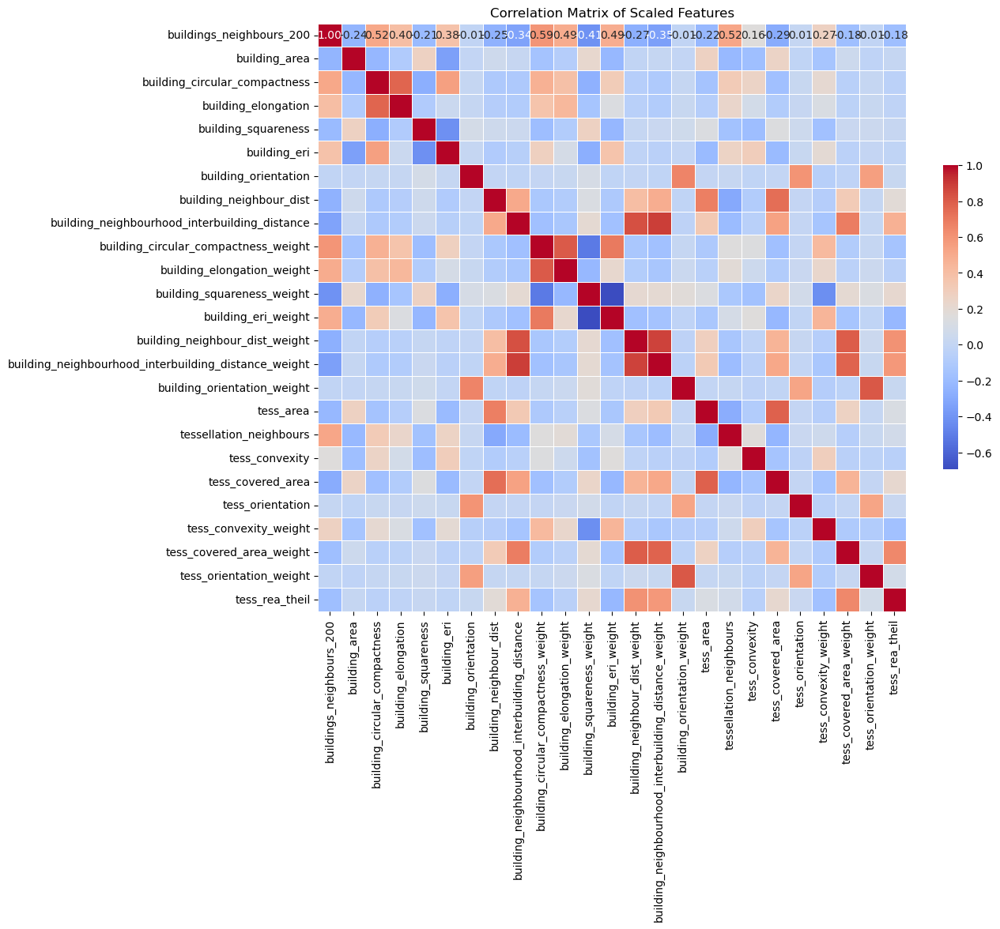

In [13]:
# Convert the numpy array back to a pandas DataFrame
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

# Calculate the correlation matrix
corr_matrix = X_scaled_df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', 
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Adding title
plt.title('Correlation Matrix of Scaled Features')

# Show the plot
plt.show()

In [14]:
residuals = y - predictions

In [15]:
# # Creating a residual plot with Seaborn
# plt.figure(figsize=(10, 6))
# sns.residplot(x=predictions, y=residuals, lowess=True, scatter_kws={'alpha': 0.05, 's': 10}, line_kws={'color': 'red'})
# plt.xlabel('Predicted Values')
# plt.ylabel('Residuals')
# plt.title('Seaborn Residual Plot')
# plt.show()

In [16]:
# plt.figure(figsize=(8, 6))
# stats.probplot(residuals, dist="norm", plot=plt)
# plt.title('Q-Q Plot of Residuals')
# plt.xlabel('Theoretical Quantiles')
# plt.ylabel('Ordered Values')
# plt.show()

In [17]:
height_cells = gpd.read_parquet(f"output/{place}/height_cells.pq").to_crs(local_crs)

In [18]:
height_cells = height_cells[height_cells['building_height'] != 255]

,raster_val,row,col,geometry
0,255,0,0,"POLYGON ((258163.648 666862.979, 258225.963 66..."
1,255,0,1,"POLYGON ((258225.963 666860.935, 258288.279 66..."
2,255,0,2,"POLYGON ((258288.279 666858.892, 258350.594 66..."
3,255,0,3,"POLYGON ((258350.594 666856.850, 258412.910 66..."
4,255,0,4,"POLYGON ((258412.910 666854.809, 258475.225 66..."
...,...,...,...,...
641,7,18,29,"POLYGON ((259906.203 664808.915, 259968.547 66..."
642,7,18,30,"POLYGON ((259968.547 664806.897, 260030.892 66..."
643,7,18,31,"POLYGON ((260030.892 664804.880, 260093.236 66..."
644,7,18,32,"POLYGON ((260093.236 664802.863, 260155.581 66..."


In [19]:
# Create a 50 km buffer around the point
buffer_circle = gpd.GeoDataFrame({'geometry': [Point(lon, lat)]}, crs=4326).to_crs(local_crs).buffer(radius * 1000)

In [20]:
# Get bounds
minx, miny, maxx, maxy = height_cells.total_bounds
min_dist = min([abs(minx-lonlat[1]), abs(miny-lonlat[0]), abs(maxx-lonlat[1]), abs(maxy-lonlat[0])])

# Create a GeoDataFrame with the specified point
gdf = gpd.GeoDataFrame(geometry=[Point(lonlat[0], lonlat[1])], crs=crs)

# The UTM zone number can be calculated from the longitude
utm_zone = int((lonlat[0] + 180) / 6) + 1
# Determine the hemisphere and assign the appropriate UTM CRS
if lonlat[1] >= 0:  # Northern Hemisphere
    local_utm_crs = f'EPSG:326{utm_zone:02d}'
else:  # Southern Hemisphere
    local_utm_crs = f'EPSG:327{utm_zone:02d}'

# Reproject to a local UTM CRS
gdf_utm = gdf.to_crs(local_utm_crs)

# Create a 50 km buffer around the point
buffer_circle = gdf_utm.buffer((radius) * 1000).to_crs(local_crs)  # Convert km to meters

In [21]:
# # Create a plot
# fig, ax = plt.subplots(figsize=(10, 10))

# # Plot the first GeoDataFrame
# cells_in_circle.plot(ax=ax, color='blue', edgecolor='k', alpha=0.2)  # Adjust color and edgecolor as needed

# # Plot the second GeoDataFrame on the same axes
# buffer_circle.plot(ax=ax, color='red', alpha=0.2)  # Adjust color and alpha for transparency as needed

# tessellation.plot(ax=ax, color="green", alpha=0.4)

# # Optionally set axis limits or other plot properties
# # ax.set_xlim([xmin, xmax])
# # ax.set_ylim([ymin, ymax])

# ctx.add_basemap(ax, crs=local_crs,source=ctx.providers.CartoDB.Positron)

# plt.show()

In [22]:
cells_in_circle = height_cells[height_cells["geometry"].within(buffer_circle.geometry[0])]


<Axes: >

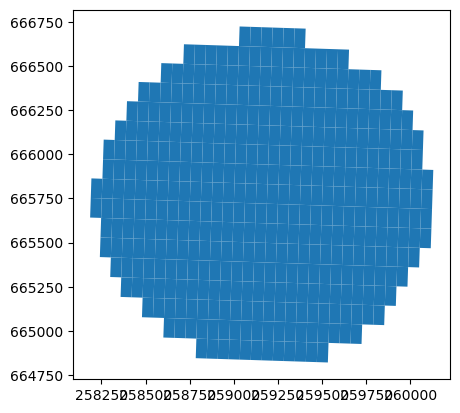

In [23]:
cells_in_circle.plot()

In [24]:
cells_in_circle 

,raster_val,row,col,geometry
48,8,1,14,"POLYGON ((259032.452 666723.605, 259094.769 66..."
49,8,1,15,"POLYGON ((259094.769 666721.574, 259157.087 66..."
50,8,1,16,"POLYGON ((259157.087 666719.543, 259219.404 66..."
51,7,1,17,"POLYGON ((259219.404 666717.514, 259281.721 66..."
52,7,1,18,"POLYGON ((259281.721 666715.485, 259344.039 66..."
...,...,...,...,...
596,10,17,18,"POLYGON ((259224.019 664942.016, 259286.362 66..."
597,10,17,19,"POLYGON ((259286.362 664939.988, 259348.704 66..."
598,9,17,20,"POLYGON ((259348.704 664937.961, 259411.047 66..."
599,8,17,21,"POLYGON ((259411.047 664935.935, 259473.390 66..."


In [25]:
# # Assuming cells_in_circle is a GeoDataFrame
# fig, ax = plt.subplots()
# cells_in_circle.plot(column='row', ax=ax, cmap='Blues')
# plt.show()

In [26]:
buildings_joint = buildings.sjoin(cells_in_circle, how='inner')

In [27]:
joint_gdf = tessellation.join(buildings_joint, on="uID", how="inner", lsuffix="_tess", rsuffix="_build").drop(["uID_tess"], axis=1)

In [28]:
tessellation_not_in_buildings = tessellation[~tessellation['uID'].isin(buildings_joint['uID'])]

<Axes: >

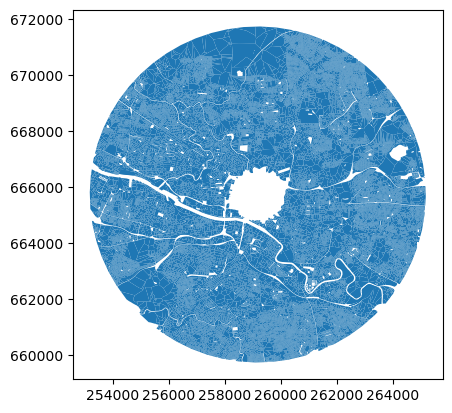

In [29]:
tessellation_not_in_buildings.plot()

In [30]:
joint_gdf.drop(["geometry_tess", "geometry_build", "uID"], axis=1).to_parquet(f"output/{place}/p4-buildings-output.pq")

In [31]:
# Assuming 'gdf' is your GeoDataFrame
# Convert GeoDataFrame to Dask DataFrame
dask_df = dd.from_pandas(joint_gdf.drop(["geometry_tess", "geometry_build", "uID", "uID_build", "index_right", "raster_val"], axis=1), npartitions=10)  # You can adjust the number of partitions

# Group by 'row' and 'col'
grouped = dask_df.groupby(["row", "col"])

stats_df = grouped.aggregate(['median', "std"], shuffle='tasks').compute()

In [32]:
out = {}

for column in joint_gdf.drop(["geometry_tess", "geometry_build", "uID", "uID_build", "index_right", "raster_val", "row", "col"], axis=1).columns:
    print(column)
    q25 = grouped[column].apply(lambda x: x.quantile(0.25), meta=('x', 'f8')).compute()
    q25.name = f"q25"
    q75 = grouped[column].apply(lambda x: x.quantile(0.75), meta=('x', 'f8')).compute()
    q75.name = f"q75"
    # kurtosis = grouped[column].apply(lambda x: x.kurtosis(), meta=('x', 'f8')).compute()
    # kurtosis.name = f"kurtosis"
    # skew =  grouped[column].apply(lambda x: x.skew(), meta=('x', 'f8')).compute()
    # skew.name = f"skew"
    
    out[column] = [stats_df[column], q25, q75]


tess_area
tessellation_neighbours
tess_convexity
tess_covered_area
tess_orientation
tess_convexity_weight
tess_covered_area_weight
tess_orientation_weight
tess_rea_theil
buildings_neighbours_200
building_area
building_circular_compactness
building_elongation
building_squareness
building_eri
building_orientation
building_neighbour_dist
building_neighbourhood_interbuilding_distance
building_circular_compactness_weight
building_elongation_weight
building_squareness_weight
building_eri_weight
building_neighbour_dist_weight
building_neighbourhood_interbuilding_distance_weight
building_orientation_weight


In [33]:
test = pd.DataFrame()

In [34]:
for key in out:
    # Concatenate the Series
    concatenated = pd.concat(out[key], axis=1)

    # Create a MultiIndex using the key and the column names of the concatenated DataFrame
    multi_index = pd.MultiIndex.from_tuples([(key, col) for col in concatenated.columns])

    # Set the MultiIndex to the concatenated DataFrame
    concatenated.columns = multi_index

    # Combine the concatenated DataFrame into stats_df
    test = pd.concat([test, concatenated], axis=1)

In [35]:
# Assume df is your DataFrame

# Transpose the DataFrame
df_transposed = test.T

# Find duplicated rows (originally columns)
duplicates = df_transposed.duplicated()

# List out the names of duplicate columns
duplicate_columns = df_transposed.index[duplicates].tolist()

# Print or process the duplicate column names
print("Duplicate columns:", duplicate_columns)

Duplicate columns: []


In [36]:
# Calculate the count of entries in each cell
cell_counts = dask_df.groupby(['row', 'col']).size().compute()
cell_counts_df = cell_counts.reset_index(name='entry_count')

In [37]:
height_cells.set_index(['row', 'col'], inplace=True)

In [38]:
gpd.GeoDataFrame(pd.concat([test, height_cells], axis=1).reset_index(), geometry="geometry")

,row,col,"(tess_area, median)","(tess_area, std)","(tess_area, q25)","(tess_area, q75)","(tessellation_neighbours, median)","(tessellation_neighbours, std)","(tessellation_neighbours, q25)","(tessellation_neighbours, q75)",...,"(building_neighbourhood_interbuilding_distance_weight, median)","(building_neighbourhood_interbuilding_distance_weight, std)","(building_neighbourhood_interbuilding_distance_weight, q25)","(building_neighbourhood_interbuilding_distance_weight, q75)","(building_orientation_weight, median)","(building_orientation_weight, std)","(building_orientation_weight, q25)","(building_orientation_weight, q75)",raster_val,geometry
0,5,28,5350.962089,1531.994835,4809.320120,5892.604057,0.069439,0.012884,0.064884,0.073994,...,35.143671,0.055816,35.123937,35.163405,4.763343,0.483232,4.592494,4.934191,7,"POLYGON ((259890.532 666251.882, 259952.856 66..."
1,12,27,2323.379370,5680.324447,1633.849231,9791.009066,0.220762,0.064923,0.149362,0.252490,...,27.120427,0.381259,26.842699,27.256066,10.708880,0.857197,10.019000,11.236490,10,"POLYGON ((259803.063 665478.007, 259865.398 66..."
2,15,27,3539.157414,4896.586716,1118.950901,5684.893767,0.129902,0.065977,0.093582,0.194877,...,26.078793,1.487097,25.012516,26.597394,19.265992,2.696789,18.341373,22.426900,7,"POLYGON ((259792.288 665145.481, 259854.628 66..."
3,14,28,6158.476863,2765.776484,2148.275946,6728.592707,0.118665,0.022492,0.107327,0.134761,...,29.113886,2.176304,28.721354,31.027317,16.576312,1.097310,16.224893,17.042692,7,"POLYGON ((259858.218 665254.303, 259920.556 66..."
4,14,27,5694.765441,655.786981,5462.909731,5926.621152,0.131422,0.018041,0.125043,0.137801,...,27.099953,2.293007,26.289252,27.910653,16.412812,0.890785,16.097871,16.727752,8,"POLYGON ((259795.880 665256.323, 259858.218 66..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
641,18,29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,"POLYGON ((259906.203 664808.915, 259968.547 66..."
642,18,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,"POLYGON ((259968.547 664806.897, 260030.892 66..."
643,18,31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,"POLYGON ((260030.892 664804.880, 260093.236 66..."
644,18,32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,"POLYGON ((260093.236 664802.863, 260155.581 66..."


In [39]:
out_df = gpd.GeoDataFrame(pd.concat([test, height_cells], axis=1).reset_index(), geometry="geometry")
out_df = out_df.merge(cell_counts_df, on=['row', 'col'], how='left')

In [40]:
def calculate_statistics(nodes, out_df):
    # Spatial join - associating each node with a polygon
    joined = gpd.sjoin(nodes, out_df, how='inner', op='intersects')

    # Creating a list to hold results
    results = []

    # Iterating through each unique polygon in the spatial join
    for polygon_id in joined['index_right'].unique():
        # Filter to include only nodes within the current polygon
        nodes_in_polygon = joined[joined['index_right'] == polygon_id]

        # Calculating statistics for each column
        stats = {'polygon_id': polygon_id}
        
        stats[f'nodes_count'] = nodes_in_polygon.iloc[0].count()
        
        for column in nodes.columns:
            if nodes[column].dtype in ['int64', 'float64']:  # Check if column is numeric
                stats[f'{column}_max'] = nodes_in_polygon[column].max()
                stats[f'{column}_min'] = nodes_in_polygon[column].min()
                stats[f'{column}_median'] = nodes_in_polygon[column].median()
                stats[f'{column}_std'] = nodes_in_polygon[column].std()
                for quantile, value in nodes_in_polygon[column].quantile([0.25, 0.5, 0.75]).items():
                    stats[f'{column}_quantile_{quantile}'] = value

        # Adding stats for this polygon to the results list
        results.append(stats)

    # Creating a DataFrame from the results
    stats_df = pd.DataFrame(results)

    # Ensuring that the merge key in out_df is a regular column (not an index)
    
    out_df.explore()
    
    out_df['polygon_id'] = out_df.index

    # Merging the stats DataFrame with the out_df GeoDataFrame
    merged_df = out_df.merge(stats_df, on='polygon_id', how='left')
    
    merged_df = merged_df.drop(columns=["polygon_id"], axis = 1)

    return merged_df

In [41]:
out_df = calculate_statistics(nodes, out_df)

/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3550: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [42]:
def calculate_line_statistics(edges, out_df, name):
    # Spatial join - associating each line with polygons it intersects
    joined = gpd.sjoin(edges, out_df, how='inner', op='intersects')

    # Creating a list to hold results
    results = []

    # Iterating through each unique polygon in the spatial join
    for polygon_id in joined['index_right'].unique():
        # Filter to include only lines intersecting the current polygon
        lines_in_polygon = joined[joined['index_right'] == polygon_id]
        
        # Calculating statistics for each column
        stats = {'polygon_id': polygon_id}
        
        stats[f'{name}_count'] = lines_in_polygon.iloc[0].count()

        for column in edges.columns:
            if edges[column].dtype in ['int64', 'float64']:  # Check if column is numeric
                stats[f'{column}_max'] = lines_in_polygon[column].max()
                stats[f'{column}_min'] = lines_in_polygon[column].min()
                stats[f'{column}_median'] = lines_in_polygon[column].median()
                for quantile, value in lines_in_polygon[column].quantile([0.25, 0.5, 0.75]).items():
                    stats[f'{column}_quantile_{quantile}'] = value

        # Adding stats for this polygon to the results list
        results.append(stats)

    # Creating a DataFrame from the results
    stats_df = pd.DataFrame(results)

    # Ensuring that the merge key in out_df is a regular column (not an index)
    out_df['polygon_id'] = out_df.index

    # Merging the stats DataFrame with the out_df GeoDataFrame
    merged_df = out_df.merge(stats_df, on='polygon_id', how="left")

    return merged_df

In [43]:
edges = edges.drop(["mm_len", "node_start", "node_end"], axis=1)

In [44]:
out_df = calculate_line_statistics(edges, out_df, "edges")

/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3550: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [45]:
out_df = calculate_line_statistics(stroke, out_df, "strokes")

/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3550: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [46]:
out_df

,row,col,"(tess_area, median)","(tess_area, std)","(tess_area, q25)","(tess_area, q75)","(tessellation_neighbours, median)","(tessellation_neighbours, std)","(tessellation_neighbours, q25)","(tessellation_neighbours, q75)",...,global_angular_betweeness_quantile_0.25,global_angular_betweeness_quantile_0.5,global_angular_betweeness_quantile_0.75,strokes_count,stroke_length_max,stroke_length_min,stroke_length_median,stroke_length_quantile_0.25,stroke_length_quantile_0.5,stroke_length_quantile_0.75
0,5,28,5350.962089,1531.994835,4809.320120,5892.604057,0.069439,0.012884,0.064884,0.073994,...,0.000280,0.019401,0.091682,157.0,5231.951686,684.096635,1966.013456,1099.908064,1966.013456,3328.124201
1,12,27,2323.379370,5680.324447,1633.849231,9791.009066,0.220762,0.064923,0.149362,0.252490,...,0.000187,0.000212,0.000237,218.0,404.423495,274.797117,339.610306,307.203712,339.610306,372.016901
2,15,27,3539.157414,4896.586716,1118.950901,5684.893767,0.129902,0.065977,0.093582,0.194877,...,0.000296,0.000529,0.000851,218.0,9294.499624,289.016160,793.918305,541.467233,793.918305,5044.208965
3,14,28,6158.476863,2765.776484,2148.275946,6728.592707,0.118665,0.022492,0.107327,0.134761,...,0.000462,0.000800,0.002325,218.0,9294.499624,99.271660,4696.885642,2398.078651,4696.885642,6995.692633
4,14,27,5694.765441,655.786981,5462.909731,5926.621152,0.131422,0.018041,0.125043,0.137801,...,0.000621,0.001046,0.002588,218.0,9294.499624,94.487426,793.918305,444.202866,793.918305,5044.208965
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
641,18,29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000131,0.000371,0.000595,127.0,2691.318976,98.547125,122.227250,110.387187,122.227250,1406.773113
642,18,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000010,0.000017,0.000174,127.0,2691.318976,39.038911,154.431395,122.227250,154.431395,821.384399
643,18,31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000,0.000012,0.000118,127.0,2691.318976,128.546867,154.431395,141.489131,154.431395,1422.875186
644,18,32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000150,0.000351,0.000830,127.0,2691.318976,75.731668,126.724094,101.227881,126.724094,1409.021535


In [47]:
out_df.geometry

0      POLYGON ((259890.532 666251.882, 259952.856 66...
1      POLYGON ((259803.063 665478.007, 259865.398 66...
2      POLYGON ((259792.288 665145.481, 259854.628 66...
3      POLYGON ((259858.218 665254.303, 259920.556 66...
4      POLYGON ((259795.880 665256.323, 259858.218 66...
                             ...                        
641    POLYGON ((259906.203 664808.915, 259968.547 66...
642    POLYGON ((259968.547 664806.897, 260030.892 66...
643    POLYGON ((260030.892 664804.880, 260093.236 66...
644    POLYGON ((260093.236 664802.863, 260155.581 66...
645    POLYGON ((260155.581 664800.848, 260217.926 66...
Name: geometry, Length: 646, dtype: geometry

In [48]:
out_df.columns = ['_'.join(map(str, col)) if type(col) is tuple else col for col in out_df.columns]

In [49]:
df = out_df.loc[:,~out_df.columns.duplicated()].copy()

In [50]:
df.rename(columns={'raster_val': 'building_height'}, inplace=True)

In [51]:
df.explore()

<Axes: >

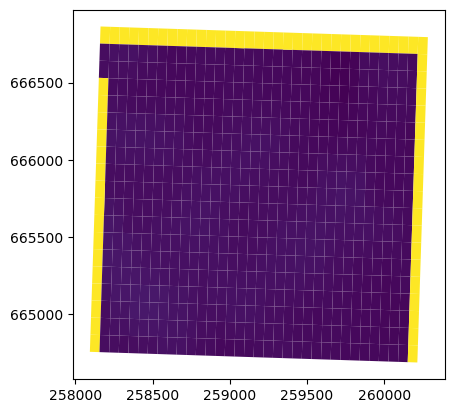

In [52]:
df.plot(column='building_height')

In [53]:
df.to_parquet(f"output/{place}/p4-grid-output.pq")

In [54]:
with rasterio.open(f'output/{place}.tif') as src:
    # Get the transform object
    transform = src.transform

    # Extract west, north, and resolution (xres, yres)
    west = transform.c
    north = transform.f
    xres = transform.a
    yres = -transform.e  # yres is negative as raster origin is top-left


In [55]:

# Open the source raster to get the transform
with rasterio.open(f'output/{place}.tif') as src:
    transform = src.transform

    west = transform.c
    north = transform.f
    xres = transform.a
    yres = -transform.e  # yres is negative as raster origin is top-left

# Calculate raster dimensions
n_rows = gdf['row'].max() - gdf['row'].min() + 1
n_cols = gdf['col'].max() - gdf['col'].min() + 1

# List of columns to be used as bands
band_columns = [col for col in gdf.columns if col not in ['row', 'col', 'geometry']]

# Initialize raster dataset
with rasterio.open(f"output/{place}/grid_with_summary_stats.tif", 'w', 
    driver='GTiff', 
    height=n_rows, 
    width=n_cols, 
    count=len(band_columns), 
    dtype=str(gdf[band_columns[0]].dtype), 
    crs=gdf.crs, 
    transform=transform
) as dst:
    for i, column in enumerate(band_columns, start=1):
        # Create an empty array filled with NaNs (or use a different no-data value)
        if column == 'building_height':
            # For 'building_height', initialize with zeros
            band_data = np.zeros((n_rows, n_cols))
        else:
            # For other columns, initialize with NaNs
            band_data = np.full((n_rows, n_cols), np.nan)

        # Update the array with data from the GeoDataFrame
        for _, row in gdf.iterrows():
            row_idx, col_idx = row['row'] - gdf['row'].min(), row['col'] - gdf['col'].min()
            band_data[row_idx, col_idx] = row[column]

        dst.write(band_data, i)

KeyError: 'row'

In [ ]:
gdf['distance_to_centre'] = gdf['geometry'].distance(centre_point_local_crs)

In [ ]:
new_gdf = gdf.drop(columns=["geometry", "row", "col"]).dropna()

In [ ]:
# Response variable
y = new_gdf['distance_to_centre']

# Feature variables (excluding the response variable)
X = new_gdf.drop(columns=['distance_to_centre'])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize and fit the Linear Regression model
model = LinearRegression()
model.fit(X_scaled, y)

# Coefficients and Intercept
coefficients = model.coef_
intercept = model.intercept_

# Predictions
predictions = model.predict(X_scaled)

# Number of observations and number of features
n = len(y)
p = X.shape[1]

# Residual Sum of Squares and Total Sum of Squares
rss = np.sum((y - predictions) ** 2)
tss = np.sum((y - np.mean(y)) ** 2)

# R-squared and Adjusted R-squared
r_squared = 1 - (rss / tss)
adjusted_r_squared = 1 - ((1 - r_squared) * (n - 1) / (n - p - 1))

# Standard Error of the coefficients
mse = rss / (n - p - 1)
se = np.sqrt(np.diagonal(mse * np.linalg.inv(np.dot(X_scaled.T, X_scaled))))

# t-statistics and p-values for coefficients
t_stats = coefficients / se
p_values = [2 * (1 - stats.t.cdf(np.abs(t), n - p - 1)) for t in t_stats]

# F-statistic
f_statistic = (r_squared / p) / ((1 - r_squared) / (n - p - 1))

def get_significance_asterisks(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# Create a summary DataFrame
summary_df = pd.DataFrame({
    'Coefficient': coefficients,
    'Standard Error': se,
    't value': t_stats,
    'p value': p_values,
    'Significance': [get_significance_asterisks(p) for p in p_values]
}, index=X.columns)
summary_df.loc['Intercept'] = [intercept, np.nan, np.nan, np.nan, '']

# Print summary statistics
print(f"Number of Observations: {n}")
print(f"R-squared: {r_squared}")
print(f"Adjusted R-squared: {adjusted_r_squared}")
print(f"F-statistic: {f_statistic}\n")

In [ ]:
summary_df.to_string()

In [ ]:
# Assuming 'summary_df' is your DataFrame
# Set the display options
pd.set_option('display.max_rows', None)  # Replace None with a specific number if the DataFrame is very large
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)  # Adjust the width for better readability if necessary
pd.set_option('display.max_colwidth', None)  # Adjust column width to show full content of each cell

In [ ]:
summary_df

In [ ]:
summary_df.to_parquet(f"output/{place}/summary_df.pq")